In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
ROOT_PATH = "/content/drive/MyDrive/Self_driving_car"
!pwd

/content


In [ ]:
import os
os.chdir(ROOT_PATH)
os.getcwd()

'/content/drive/MyDrive/Self_driving_car'

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout,Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
columns = ['center','left','right','steering','throttle','reverse','speed']
data = pd.read_csv(os.path.join(ROOT_PATH,"driving_log.csv"), names=columns)
pd.set_option('display.max_colwidth',-1)
data.head()

<ipython-input-5-29b711a4a822>:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth',-1)


,center,left,right,steering,throttle,reverse,speed
0,D:\Megha\SelfDrivingCar\Data\IMG\center_2023_07_08_14_37_50_128.jpg,D:\Megha\SelfDrivingCar\Data\IMG\left_2023_07_08_14_37_50_128.jpg,D:\Megha\SelfDrivingCar\Data\IMG\right_2023_07_08_14_37_50_128.jpg,0.0,0.0,0.0,7.494977
1,D:\Megha\SelfDrivingCar\Data\IMG\center_2023_07_08_14_37_50_228.jpg,D:\Megha\SelfDrivingCar\Data\IMG\left_2023_07_08_14_37_50_228.jpg,D:\Megha\SelfDrivingCar\Data\IMG\right_2023_07_08_14_37_50_228.jpg,0.0,0.0,0.0,7.417505
2,D:\Megha\SelfDrivingCar\Data\IMG\center_2023_07_08_14_37_50_334.jpg,D:\Megha\SelfDrivingCar\Data\IMG\left_2023_07_08_14_37_50_334.jpg,D:\Megha\SelfDrivingCar\Data\IMG\right_2023_07_08_14_37_50_334.jpg,0.0,0.0,0.0,7.340810
3,D:\Megha\SelfDrivingCar\Data\IMG\center_2023_07_08_14_37_50_441.jpg,D:\Megha\SelfDrivingCar\Data\IMG\left_2023_07_08_14_37_50_441.jpg,D:\Megha\SelfDrivingCar\Data\IMG\right_2023_07_08_14_37_50_441.jpg,0.0,0.0,0.0,7.249791
4,D:\Megha\SelfDrivingCar\Data\IMG\center_2023_07_08_14_37_50_543.jpg,D:\Megha\SelfDrivingCar\Data\IMG\left_2023_07_08_14_37_50_543.jpg,D:\Megha\SelfDrivingCar\Data\IMG\right_2023_07_08_14_37_50_543.jpg,0.0,0.0,0.0,7.174778


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center']= data['center'].apply(path_leaf)
data['left']= data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_07_08_14_37_50_128.jpg,left_2023_07_08_14_37_50_128.jpg,right_2023_07_08_14_37_50_128.jpg,0.0,0.0,0.0,7.494977
1,center_2023_07_08_14_37_50_228.jpg,left_2023_07_08_14_37_50_228.jpg,right_2023_07_08_14_37_50_228.jpg,0.0,0.0,0.0,7.417505
2,center_2023_07_08_14_37_50_334.jpg,left_2023_07_08_14_37_50_334.jpg,right_2023_07_08_14_37_50_334.jpg,0.0,0.0,0.0,7.340810
3,center_2023_07_08_14_37_50_441.jpg,left_2023_07_08_14_37_50_441.jpg,right_2023_07_08_14_37_50_441.jpg,0.0,0.0,0.0,7.249791
4,center_2023_07_08_14_37_50_543.jpg,left_2023_07_08_14_37_50_543.jpg,right_2023_07_08_14_37_50_543.jpg,0.0,0.0,0.0,7.174778


In [ ]:
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_07_08_14_37_50_128.jpg,left_2023_07_08_14_37_50_128.jpg,right_2023_07_08_14_37_50_128.jpg,0.0,0.0,0.0,7.494977
1,center_2023_07_08_14_37_50_228.jpg,left_2023_07_08_14_37_50_228.jpg,right_2023_07_08_14_37_50_228.jpg,0.0,0.0,0.0,7.417505
2,center_2023_07_08_14_37_50_334.jpg,left_2023_07_08_14_37_50_334.jpg,right_2023_07_08_14_37_50_334.jpg,0.0,0.0,0.0,7.340810
3,center_2023_07_08_14_37_50_441.jpg,left_2023_07_08_14_37_50_441.jpg,right_2023_07_08_14_37_50_441.jpg,0.0,0.0,0.0,7.249791
4,center_2023_07_08_14_37_50_543.jpg,left_2023_07_08_14_37_50_543.jpg,right_2023_07_08_14_37_50_543.jpg,0.0,0.0,0.0,7.174778


visulaisation of the data

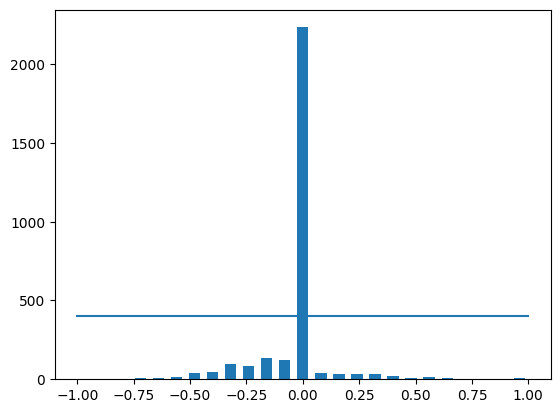

In [ ]:
num_bins =25
samples_per_bin=400
hist,bins =np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width = 0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 3010
(3010, 7)


In [ ]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <=bins[j+1]:
      list_.append(i)
  list_ =shuffle(list_)
  list_ =list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:' , len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:',len(data))

removed: 1834
remaining: 1176


In [ ]:
len(list_)

0

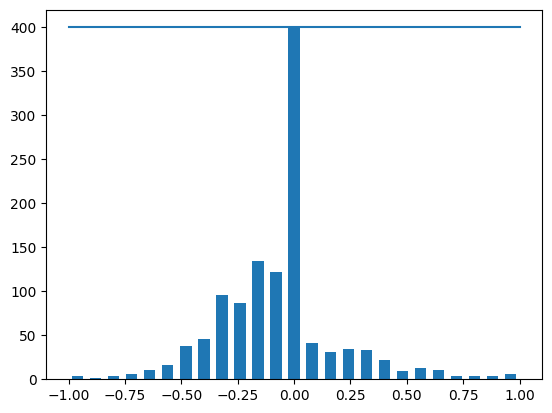

In [ ]:

hist,bins =np.histogram(data['steering'], num_bins)
plt.bar(center, hist, width = 0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
def load_img_steering(ROOT_PATH, df):
  image_path=[]
  steering=[]
  for i in range(len(data)):
    indexed_data=data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(ROOT_PATH, center.strip()))
    steering.append(float(indexed_data[3]))
    #left image append
    image_path.append(os.path.join(ROOT_PATH, left.strip()))
    steering.append(float(indexed_data[3])+ 0.15)
     #right image append
    image_path.append(os.path.join(ROOT_PATH, left.strip()))
    steering.append(float(indexed_data[3])- 0.15)
    #converting list to array , as array
  image_paths=np.asarray(image_path)
  steerings= np.asarray(steering)
  return image_paths, steerings


In [ ]:
len(data)
print(data.shape)


(1176, 7)


In [ ]:
data

,center,left,right,steering,throttle,reverse,speed
9,center_2023_07_08_14_37_51_065.jpg,left_2023_07_08_14_37_51_065.jpg,right_2023_07_08_14_37_51_065.jpg,-0.143467,0.0,0.0,6.792739
10,center_2023_07_08_14_37_51_166.jpg,left_2023_07_08_14_37_51_166.jpg,right_2023_07_08_14_37_51_166.jpg,-0.300976,0.0,0.0,6.693439
11,center_2023_07_08_14_37_51_270.jpg,left_2023_07_08_14_37_51_270.jpg,right_2023_07_08_14_37_51_270.jpg,-0.012700,0.0,0.0,6.623925
16,center_2023_07_08_14_37_51_793.jpg,left_2023_07_08_14_37_51_793.jpg,right_2023_07_08_14_37_51_793.jpg,0.000000,0.0,0.0,6.272270
17,center_2023_07_08_14_37_51_896.jpg,left_2023_07_08_14_37_51_896.jpg,right_2023_07_08_14_37_51_896.jpg,0.000000,0.0,0.0,6.207228
...,...,...,...,...,...,...,...
2999,center_2023_07_08_14_43_03_054.jpg,left_2023_07_08_14_43_03_054.jpg,right_2023_07_08_14_43_03_054.jpg,0.000000,0.0,0.0,23.979450
3000,center_2023_07_08_14_43_03_157.jpg,left_2023_07_08_14_43_03_157.jpg,right_2023_07_08_14_43_03_157.jpg,0.000000,0.0,0.0,23.736770
3002,center_2023_07_08_14_43_03_372.jpg,left_2023_07_08_14_43_03_372.jpg,right_2023_07_08_14_43_03_372.jpg,0.000000,0.0,0.0,23.211430
3003,center_2023_07_08_14_43_03_475.jpg,left_2023_07_08_14_43_03_475.jpg,right_2023_07_08_14_43_03_475.jpg,0.000000,0.0,0.0,22.976470


In [ ]:
image_paths, steerings = load_img_steering(ROOT_PATH + '/IMG', data)


In [ ]:
image_paths, steerings

(array(['/content/drive/MyDrive/Self_driving_car/IMG/center_2023_07_08_14_37_51_065.jpg',
        '/content/drive/MyDrive/Self_driving_car/IMG/left_2023_07_08_14_37_51_065.jpg',
        '/content/drive/MyDrive/Self_driving_car/IMG/left_2023_07_08_14_37_51_065.jpg',
        ...,
        '/content/drive/MyDrive/Self_driving_car/IMG/center_2023_07_08_14_43_03_579.jpg',
        '/content/drive/MyDrive/Self_driving_car/IMG/left_2023_07_08_14_43_03_579.jpg',
        '/content/drive/MyDrive/Self_driving_car/IMG/left_2023_07_08_14_43_03_579.jpg'],
       dtype='<U78'),
 array([-0.1434672,  0.0065328, -0.2934672, ...,  0.       ,  0.15     ,
        -0.15     ]))

In [ ]:
steerings

array([-0.1434672,  0.0065328, -0.2934672, ...,  0.       ,  0.15     ,
       -0.15     ])

In [ ]:
X_train, X_test, y_train, y_test =train_test_split(image_paths, steerings , test_size=0.2, random_state =6)

In [ ]:
len(X_train) , len(X_test)

(2822, 706)

Text(0.5, 1.0, 'Testing set')

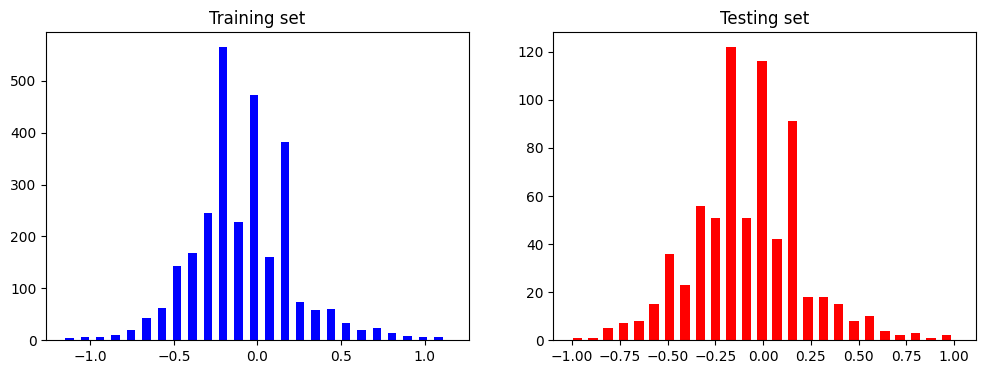

In [ ]:
fig, axes = plt.subplots(1,2, figsize =(12,4))
axes[0].hist(y_train, bins=num_bins, width= 0.05, color="blue")
axes[0].set_title('Training set')
axes[1].hist(y_test, bins=num_bins, width= 0.05, color="red")
axes[1].set_title('Testing set')

Text(0.5, 1.0, 'Zoomed image')

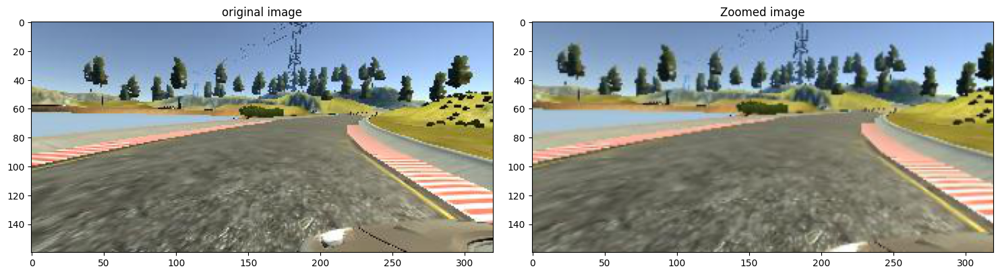

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale=(1,1.3))
  image= zoom.augment_image(image)
  return image

image=image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image= zoom(original_image)

fig, axs =plt.subplots(1,2, figsize=(15,10))
fig.tight_layout() #to reduce overlapping image or any spaces, for better view

axs[0].imshow(original_image)
axs[0].set_title("original image")

axs[1].imshow(zoomed_image)
axs[1].set_title("Zoomed image")



Text(0.5, 1.0, 'Panned image')

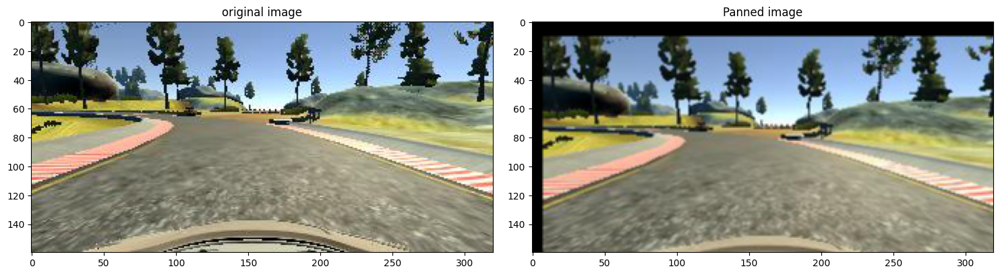

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : ( -0.1, 0.1), "y" : (-0.1, 0.1)})
  image= pan.augment_image(image)
  return image

image=image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image= pan(original_image)

fig, axs =plt.subplots(1,2, figsize=(15,10))
fig.tight_layout() #to reduce overlapping image or any spaces, for better view

axs[0].imshow(original_image)
axs[0].set_title("original image")

axs[1].imshow(panned_image)
axs[1].set_title("Panned image")

Text(0.5, 1.0, 'brightened image')

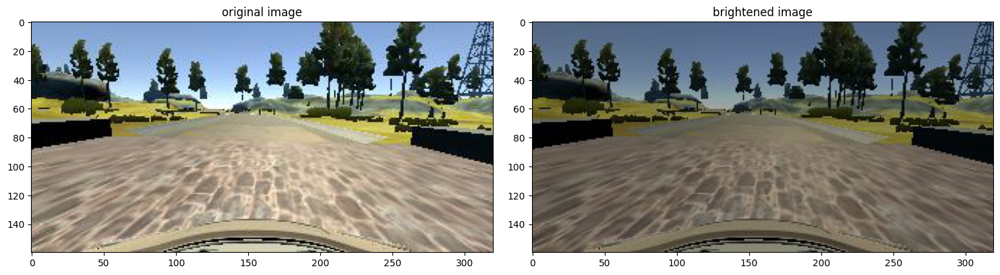

In [ ]:
def img_random_brightness(image):
  brighntess = iaa.Multiply((0.2 , 1.2))
  image = brighntess.augment_image(image)
  return image

image=image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightened_image= img_random_brightness(original_image)

fig, axs =plt.subplots(1,2, figsize=(15,10))
fig.tight_layout() #to reduce overlapping image or any spaces, for better view

axs[0].imshow(original_image)
axs[0].set_title("original image")

axs[1].imshow(brightened_image)
axs[1].set_title("brightened image")


0.0


Text(0.5, 1.0, 'FLIPPED_image-Steering Angle:-0.0')

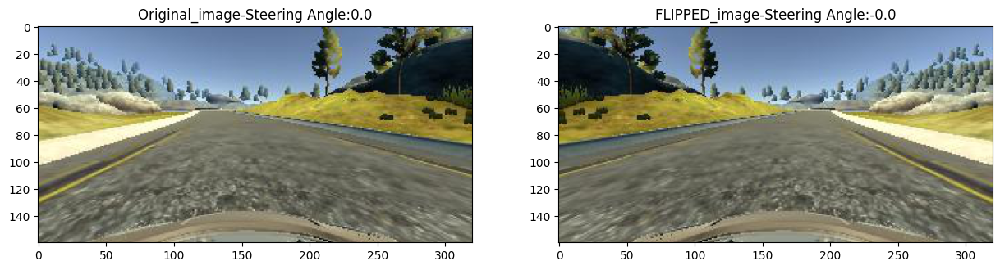

In [ ]:
def img_random_flip(image, steering_angle):
  image= cv2.flip(image,1)
  steering_angle= -steering_angle
  return image, steering_angle

random_index = random.randint(0,1000)
image = image_paths[random_index]
steering_angle= steerings[random_index]

print(steering_angle)

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle= img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1,2, figsize= (15,10))

axs[0].imshow(original_image)
axs[0].set_title("Original_image-" + "Steering Angle:" + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title("FLIPPED_image-" + "Steering Angle:" + str(flipped_steering_angle))



In [ ]:
def random_augment(image, steering_angle):
  image =mpimg.imread(image)
  if np.random.rand() <0.5:
    image= pan(image)
  if np.random.rand() <0.5:
    image= zoom(image)
  if np.random.rand() <0.5:
    image= img_random_brightness(image)
  if np.random.rand() <0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

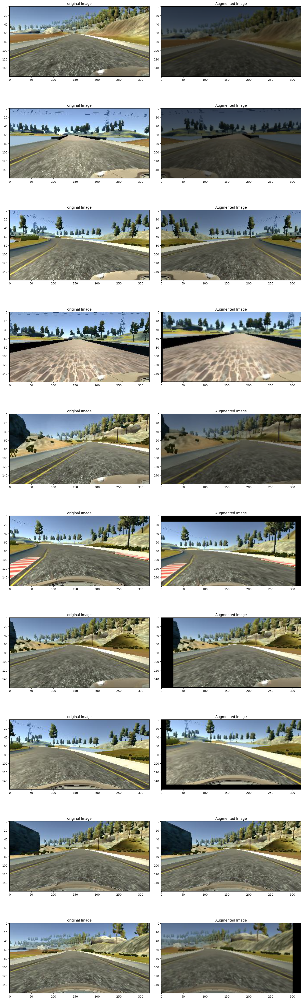

In [ ]:
ncol= 2
nrow= 10

fig,axs = plt.subplots(nrow, ncol, figsize = (15,50))
fig.tight_layout()

for i in range(10):
  randnum =random.randint(0, len(image_paths) -1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image= mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
def img_preprocess(img):
  img = img[60:135, :, :]  #crop img
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV) #convert rgb to yuv for nvdia model
  img = cv2.GaussianBlur(img, (3,3), 0)  #to smooth out the image
  img = cv2.resize(img, (200,66))  #input size to nvdia model
  img = img/255
  return img


Text(0.5, 1.0, 'Preprocess_image')

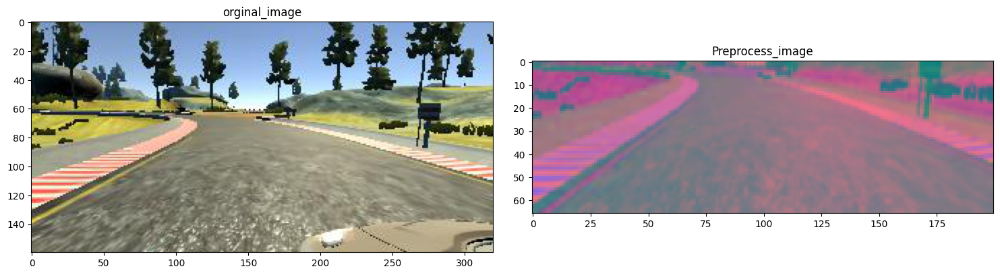

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig,axs = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('orginal_image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocess_image')

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size , istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) -1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))


Text(0.5, 1.0, 'Validation Image')

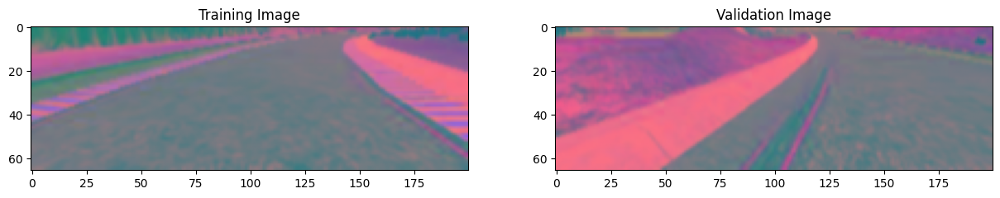

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_test_gen, y_valid_gen = next(batch_generator(X_test, y_test, 1,0))

fig, axs = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_test_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5,5), strides=(2,2), input_shape= (66, 200, 3), activation= 'elu'))
  model.add(Conv2D(36, (5,5), strides=(2,2), activation = 'elu'))
  model.add(Conv2D(48, (5,5,), strides =(2,2), activation = 'elu'))
  model.add(Conv2D(64, (5,5), activation= 'elu'))
  #model.add(Cov2D(64, (5,5), activation= 'elu'))
  #model.add(Dropout(0.5))

  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
  #model.add(Dropout(0.5))

  model.add(Dense(50, activation= 'elu'))
   #model.add(Dropout(0.5))

  model.add(Dense(10, activation= 'elu'))
   #model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
  model.compile(loss='mse', optimizer= optimizer)
  return model

model = nvidia_model()
print(model.summary())


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)               

In [ ]:
history= model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch= 300,
                             epochs=10,
                             validation_data= batch_generator(X_test, y_test, 100, 0),
                             validation_steps = 200,
                             verbose=1,
                             shuffle=1)

<ipython-input-39-fca71756235f>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history= model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 1541s 5s/step - loss: 0.1402 - val_loss: 0.0780
Epoch 2/10
300/300 [==============================] - 215s 720ms/step - loss: 0.0856 - val_loss: 0.0646
Epoch 3/10
300/300 [==============================] - 235s 785ms/step - loss: 0.0791 - val_loss: 0.0635
Epoch 4/10
300/300 [==============================] - 216s 723ms/step - loss: 0.0735 - val_loss: 0.0604
Epoch 5/10
300/300 [==============================] - 216s 724ms/step - loss: 0.0700 - val_loss: 0.0638
Epoch 6/10
300/300 [==============================] - 216s 722ms/step - loss: 0.0693 - val_loss: 0.0607
Epoch 7/10
300/300 [==============================] - 216s 721ms/step - loss: 0.0669 - val_loss: 0.0587
Epoch 8/10
300/300 [==============================] - 237s 793ms/step - loss: 0.0657 - val_loss: 0.0607
Epoch 9/10
300/300 [==============================] - 213s 713ms/step - loss: 0.0656 - val_loss: 0.0561
Epoch 10/10
300/300 [==============================] - 214s 714ms/

Text(0.5, 0, 'Epoch')

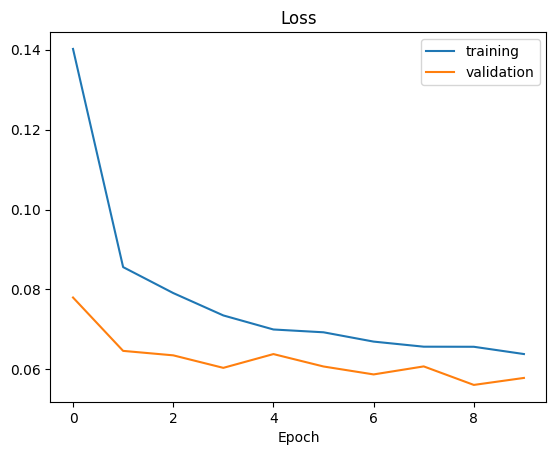

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history["val_loss"])
plt.legend(["training", "validation"])
plt.title("Loss")
plt.xlabel("Epoch")


In [ ]:
model.save("model.h5")
from google.colab import files
files.download("model.h5")